Importing the libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import geopandas as gpd
import seaborn as sns


In [ ]:
df_11=pd.read_csv(r"/Users/vidushigupta/Desktop/Vidushi/COVID dataset/clean_data.csv")
df_11.head()

,Unnamed: 0,States,March,April,May
0,0,AN,10,23,0
1,1,AP,44,1359,2168
2,2,AR,0,1,3
3,3,AS,1,42,1297
4,4,BR,21,404,3382


Importing a shapefile for the map

In [ ]:
fp = "/Users/vidushigupta/Desktop/Vidushi/COVID dataset/india_map/Indian_States.shp"
map_df = gpd.read_file(fp)
map_df.head()

,st_nm,geometry
0,Andaman & Nicobar Island,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2..."
1,Arunanchal Pradesh,"POLYGON ((96.16261 29.38078, 96.16860 29.37432..."
2,Assam,"MULTIPOLYGON (((89.74323 26.30362, 89.74290 26..."
3,Bihar,"MULTIPOLYGON (((84.50720 24.26323, 84.50355 24..."
4,Chandigarh,"POLYGON ((76.84147 30.75996, 76.83599 30.73623..."


In [ ]:
map_df=map_df.sort_values('st_nm')

In [ ]:
map_df.reset_index(level=0, inplace=True)
map_df.drop('index', axis=1, inplace=True)
map_df.head()

,st_nm,geometry
0,Andaman & Nicobar Island,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2..."
1,Andhra Pradesh,"MULTIPOLYGON (((81.10380 17.82269, 81.10610 17..."
2,Arunanchal Pradesh,"POLYGON ((96.16261 29.38078, 96.16860 29.37432..."
3,Assam,"MULTIPOLYGON (((89.74323 26.30362, 89.74290 26..."
4,Bihar,"MULTIPOLYGON (((84.50720 24.26323, 84.50355 24..."


In [ ]:
map_df.at[23,'st_nm']= 'Delhi'

In [ ]:
map_df=map_df.sort_values('st_nm')

In [ ]:
map_df.reset_index(level=0, inplace=True)
map_df.drop('index', axis=1, inplace=True)
map_df.head()

,st_nm,geometry
0,Andaman & Nicobar Island,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2..."
1,Andhra Pradesh,"MULTIPOLYGON (((81.10380 17.82269, 81.10610 17..."
2,Arunanchal Pradesh,"POLYGON ((96.16261 29.38078, 96.16860 29.37432..."
3,Assam,"MULTIPOLYGON (((89.74323 26.30362, 89.74290 26..."
4,Bihar,"MULTIPOLYGON (((84.50720 24.26323, 84.50355 24..."


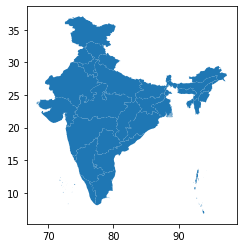

In [ ]:
map_df.plot()

In [ ]:
merged = map_df.join(df_11)
merged.head()

,st_nm,geometry,Unnamed: 0,States,March,April,May
0,Andaman & Nicobar Island,"MULTIPOLYGON (((93.71976 7.20707, 93.71909 7.2...",0,AN,10,23,0
1,Andhra Pradesh,"MULTIPOLYGON (((81.10380 17.82269, 81.10610 17...",1,AP,44,1359,2168
2,Arunanchal Pradesh,"POLYGON ((96.16261 29.38078, 96.16860 29.37432...",2,AR,0,1,3
3,Assam,"MULTIPOLYGON (((89.74323 26.30362, 89.74290 26...",3,AS,1,42,1297
4,Bihar,"MULTIPOLYGON (((84.50720 24.26323, 84.50355 24...",4,BR,21,404,3382


In [ ]:
merged.describe()

,Unnamed: 0,March,April,May
count,36.000000,36.000000,36.000000,36.000000
mean,17.500000,45.416667,923.111111,4166.805556
std,10.535654,68.910864,1926.122141,10184.256704
min,0.000000,0.000000,0.000000,0.000000
25%,8.750000,1.000000,2.750000,57.250000
50%,17.500000,9.500000,84.000000,811.000000
75%,26.250000,69.500000,776.000000,2837.500000
max,35.000000,302.000000,10196.000000,57157.000000


Plotting the maps

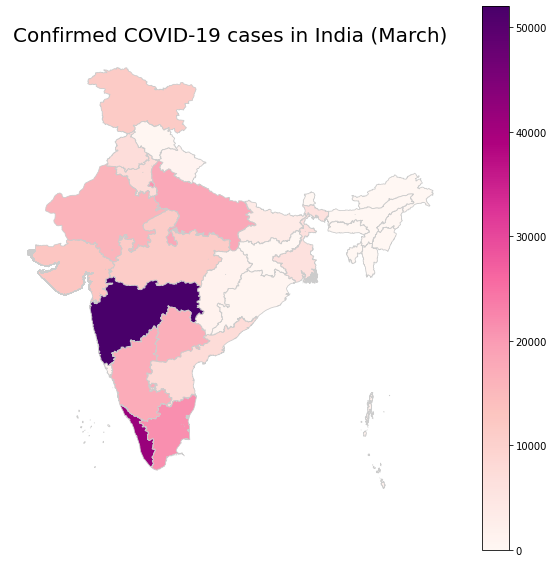

In [ ]:
variable = 'March'
vmin, vmax = 0, 52000
fig, ax = plt.subplots(1, figsize=(10, 10))
merged.plot(column=variable, cmap='RdPu', linewidth=0.8, ax=ax, edgecolor='0.8')
ax.axis('off')
ax.set_title('Confirmed COVID-19 cases in India (March)', fontdict={'fontsize': '20', 'fontweight' : '5'})
sm = plt.cm.ScalarMappable(cmap='RdPu', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = fig.colorbar(sm)